# Linear Regression




## Environment setup

In [1]:
import platform

print(f"Python version: {platform.python_version()}")
assert platform.python_version_tuple() >= ("3", "6")

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.graph_objs as go
import pandas as pd

print(f"NumPy version: {np.__version__}")

Python version: 3.6.15
NumPy version: 1.19.5


In [2]:
# Setup plots
%matplotlib inline
plt.rcParams["figure.figsize"] = 10, 8
%config InlineBackend.figure_format = "retina"
sns.set()

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

In [3]:
print(pd.__version__)

1.1.5


In [4]:
import pandas as pd

In [5]:
import sklearn

print(f"scikit-learn version: {sklearn.__version__}")
assert sklearn.__version__ >= "0.20"

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, SGDRegressor, Ridge
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import Pipeline

scikit-learn version: 0.24.2


## Introduction

### Linear regression in a nutshell

A linear regression model searches for a linear relationship between inputs (features) and output (target).

[![Linear Regression example](https://github.com/bpesquet/mlhandbook/blob/master/algorithms/images/linear_regression.png?raw=1)](https://en.wikipedia.org/wiki/Linear_regression)

### Problem formulation

A linear model makes a prediction by computing a weighted sum of the input features, plus a constant term called *bias* (or sometimes *intercept*).

$$y' = \theta_0 + \theta_1x_1 + \dotsc + \theta_nx_n$$

- $y'$ is the model's output (prediction).
- $n$ is the number of features for a data sample.
- $x_i, i \in [1..n]$ is the value of the $i$th feature.
- $\theta_i, i \in [0..n]$ is $i$th model parameter. $\theta_0$ is the bias term.

The goal is to find the best set of parameters.

### Example: using a linear model to predict country happiness

(Inspired by [Homemade Machine Learning](https://github.com/trekhleb/homemade-machine-learning) by Oleksii Trekhleb)

The [World Happiness Report](https://www.kaggle.com/unsdsn/world-happiness#2017.csv) ranks 155 countries by their happiness levels. Several economic and social indicators (GDP, degree of freedom, level of corruption...) are recorded for each country.

Can a linear model accurately predict country happiness based on these indicators ?

### Data loading and analysis

In [6]:
# Load World Happiness Report for 2017
dataset_url = "https://raw.githubusercontent.com/bpesquet/mlhandbook/master/datasets/world-happiness-report-2017.csv"
df_happiness = pd.read_csv(dataset_url)

# Print dataset shape (rows and columns)
print(f"Dataset shape: {df_happiness.shape}")

Dataset shape: (155, 12)


In [7]:
# Print a concise summary of the dataset
df_happiness.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155 entries, 0 to 154
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Country                        155 non-null    object 
 1   Happiness.Rank                 155 non-null    int64  
 2   Happiness.Score                155 non-null    float64
 3   Whisker.high                   155 non-null    float64
 4   Whisker.low                    155 non-null    float64
 5   Economy..GDP.per.Capita.       155 non-null    float64
 6   Family                         155 non-null    float64
 7   Health..Life.Expectancy.       155 non-null    float64
 8   Freedom                        155 non-null    float64
 9   Generosity                     155 non-null    float64
 10  Trust..Government.Corruption.  155 non-null    float64
 11  Dystopia.Residual              155 non-null    float64
dtypes: float64(10), int64(1), object(1)
memory usage: 

In [8]:
# Show the 10 first samples
df_happiness.head(n=10)

,Country,Happiness.Rank,Happiness.Score,Whisker.high,Whisker.low,Economy..GDP.per.Capita.,Family,Health..Life.Expectancy.,Freedom,Generosity,Trust..Government.Corruption.,Dystopia.Residual
0,Norway,1,7.537,7.594445,7.479556,1.616463,1.533524,0.796667,0.635423,0.362012,0.315964,2.277027
1,Denmark,2,7.522,7.581728,7.462272,1.482383,1.551122,0.792566,0.626007,0.355280,0.400770,2.313707
2,Iceland,3,7.504,7.622030,7.385970,1.480633,1.610574,0.833552,0.627163,0.475540,0.153527,2.322715
3,Switzerland,4,7.494,7.561772,7.426227,1.564980,1.516912,0.858131,0.620071,0.290549,0.367007,2.276716
4,Finland,5,7.469,7.527542,7.410458,1.443572,1.540247,0.809158,0.617951,0.245483,0.382612,2.430182
5,Netherlands,6,7.377,7.427426,7.326574,1.503945,1.428939,0.810696,0.585384,0.470490,0.282662,2.294804
6,Canada,7,7.316,7.384403,7.247597,1.479204,1.481349,0.834558,0.611101,0.435540,0.287372,2.187264
7,New Zealand,8,7.314,7.379510,7.248490,1.405706,1.548195,0.816760,0.614062,0.500005,0.382817,2.046456
8,Sweden,9,7.284,7.344095,7.223905,1.494387,1.478162,0.830875,0.612924,0.385399,0.384399,2.097538
9,Australia,10,7.284,7.356651,7.211349,1.484415,1.510042,0.843887,0.601607,0.477699,0.301184,2.065211


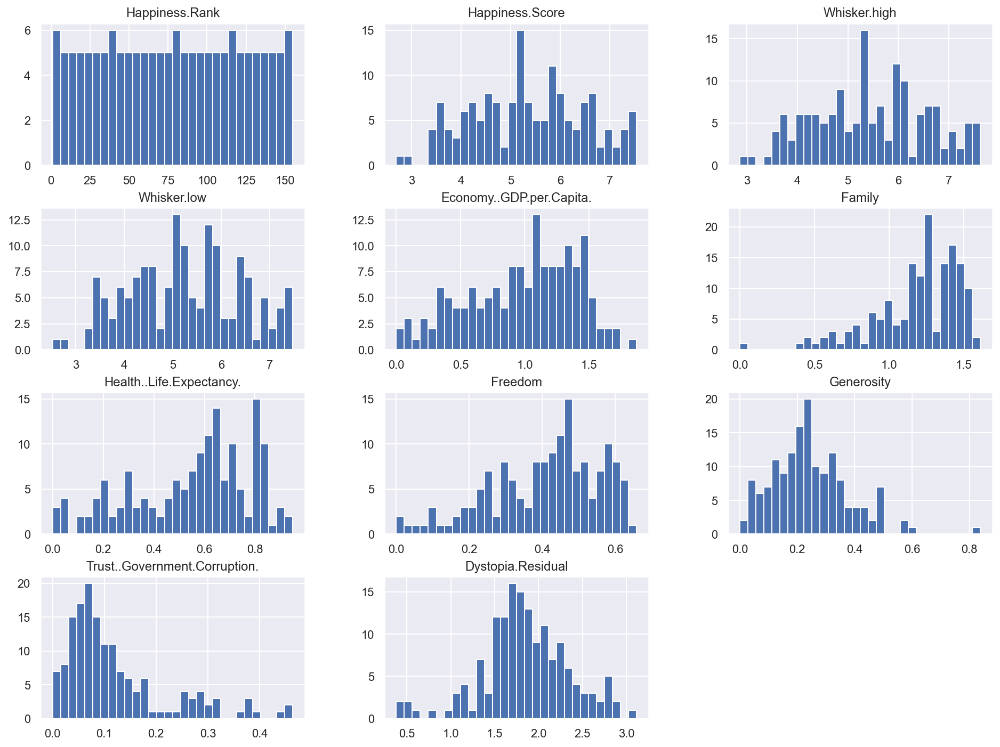

In [9]:
# Plot histograms for all numerical attributes
df_happiness.hist(bins=30, figsize=(16, 12))
plt.show()

### Univariate regression

Only one feature is used by the model, which has two parameters.

$$y' = \theta_0 + \theta_1x$$

### Example: predict country happiness using only GDP

In [10]:
def filter_dataset(df_data, input_features, target_feature):
    """Return a dataset containing only the selected input and output features"""
    df_filtered = pd.DataFrame()
    #### YOUR CODE HERE ####

    for column in df_data.columns:
      if column in input_features or column == target_feature:
        df_filtered[column] = df_data[column]
    ####
    return df_filtered

In [11]:
# Define GDP as sole input feature
input_features_uni = ["Economy..GDP.per.Capita."]
# Define country happiness as target
target_feature = "Happiness.Score"

df_happiness_uni = filter_dataset(df_happiness, input_features_uni, target_feature)

In [12]:
print(df_happiness_uni.head())

   Happiness.Score  Economy..GDP.per.Capita.
0            7.537                  1.616463
1            7.522                  1.482383
2            7.504                  1.480633
3            7.494                  1.564980
4            7.469                  1.443572


In [13]:
# Show 10 random samples
df_happiness_uni.sample(n=10)

,Happiness.Score,Economy..GDP.per.Capita.
90,5.181,0.730573
132,4.081,0.381431
44,6.003,0.909784
98,4.962,0.479820
111,4.553,0.560479
65,5.611,1.320879
85,5.230,1.079374
151,3.462,0.777153
37,6.168,1.361356
121,4.315,0.792221


### Data splitting

In [14]:
help(df_happiness_uni.sample)

Help on method sample in module pandas.core.generic:

sample(n=None, frac=None, replace=False, weights=None, random_state=None, axis=None) -> ~FrameOrSeries method of pandas.core.frame.DataFrame instance
    Return a random sample of items from an axis of object.
    
    You can use `random_state` for reproducibility.
    
    Parameters
    ----------
    n : int, optional
        Number of items from axis to return. Cannot be used with `frac`.
        Default = 1 if `frac` = None.
    frac : float, optional
        Fraction of axis items to return. Cannot be used with `n`.
    replace : bool, default False
        Allow or disallow sampling of the same row more than once.
    weights : str or ndarray-like, optional
        Default 'None' results in equal probability weighting.
        If passed a Series, will align with target object on index. Index
        values in weights not found in sampled object will be ignored and
        index values in sampled object not in weights will be

In [15]:
def percentage(dataset, features, perc):
  size = int(len(dataset)*perc)
  dataset1 = dataset[features][:size]
  dataset2 = dataset[features][size:]
  return dataset1.values, dataset2.to_numpy()

In [16]:
def split_dataset(df_data, input_features, target_feature, perc):
    """80/20 Split dataset between training and test sets, keeping only selected features"""
    
    ### YOUR CODE HERE

    df_fltrd = filter_dataset(df_data, input_features, target_feature)
    df_fltrd = df_fltrd.sample(frac=1)
    x_train, x_test = percentage(df_fltrd, input_features, perc)
    y_train, y_test = percentage(df_fltrd, [target_feature], perc)

    ###
    return x_train, y_train, x_test, y_test

In [17]:
x_train_uni, y_train_uni, x_test_uni, y_test_uni = split_dataset(
    df_happiness_uni, input_features_uni, target_feature, 0.8
)

In [18]:
print(x_train_uni.shape, y_train_uni.shape, x_test_uni.shape, y_test_uni.shape)
print(df_happiness_uni.shape)

(124, 1) (124, 1) (31, 1) (31, 1)
(155, 2)


### Data plotting

In [19]:
def plot_univariate(x, y, input_features, target_features, model_list=None):
    """2D plot of features and target, including model prediction if defined"""

    plt.scatter(x, y, label="Actual")

    if model_list is not None:
        predictions_count = 100
        x_pred = np.linspace(x.min(), x.max(), predictions_count).reshape(
            predictions_count, 1
        )

        for model_name, model_tuple in model_list.items():
            model, color = model_tuple
            y_pred = model.predict(x_pred)
            plt.plot(x_pred, y_pred, color, label=model_name)

    plt.xlabel(input_features)
    plt.ylabel(target_feature)
    plt.title("Countries Happiness")
    plt.legend()

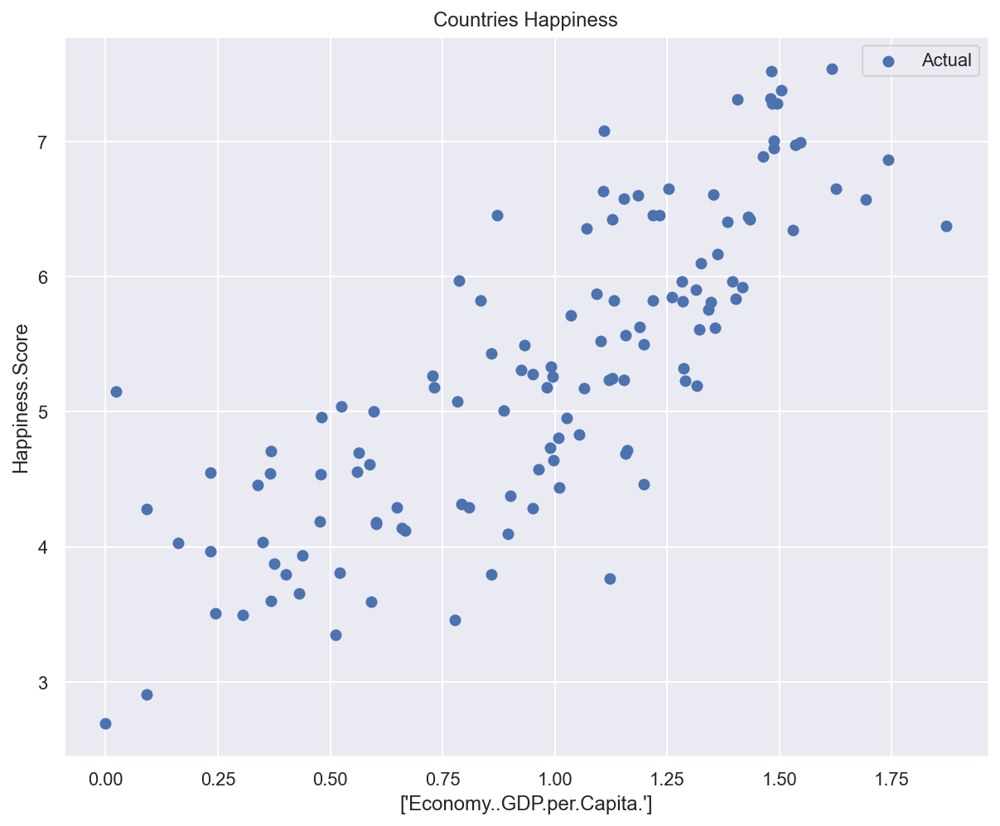

In [20]:
# Plot training data
plot_univariate(x_train_uni, y_train_uni, input_features_uni, target_feature)

## Iterative approach: gradient descent

### Problem formulation

- $\pmb{x}^{(i)}$: $i$th data sample, vector of $n+1$ features $x^{(i)}_j$ with $x^{(i)}_0 = 1$.
- $\pmb{\theta}$: parameters of the linear model, vector of $n+1$ values $\theta_j$.
- $\mathcal{h}_\theta$: hypothesis function (relationship between inputs and targets).
- $y'^{(i)}$: model output for the $i$th sample.

$$\pmb{x}^{(i)} = \begin{pmatrix}
       \ x^{(i)}_0 \\
       \ x^{(i)}_1 \\
       \ \vdots \\
       \ x^{(i)}_n
     \end{pmatrix} \in \pmb{R}^{n+1}
\;\;\;
\pmb{\theta} = \begin{pmatrix}
       \ \theta_0 \\
       \ \theta_1 \\
       \ \vdots \\
       \ \theta_n
     \end{pmatrix} \in \pmb{R}^{n+1}$$

$$y'^{(i)} = \mathcal{h}_\theta(x^{(i)}) = \theta_0 + \theta_1x^{(i)}_1 + \dotsc + \theta_nx^{(i)}_n = \pmb{\theta}^T\pmb{x}^{(i)}$$

### Loss function

We use the *Mean Squared Error* (MSE). RMSE is also a possible choice.

$$\mathcal{L}(\pmb{\theta}) = \frac{1}{m}\sum_{i=1}^m (y'^{(i)} - y^{(i)})^2 = \frac{1}{m}\sum_{i=1}^m (\mathcal{h}_\theta(x^{(i)}) - y^{(i)})^2$$

#### Vectorized loss

The loss can also be expressed using a vectorized notation.

$$\mathcal{L}(\pmb{\theta}) = \frac{1}{m}\sum_{i=1}^m (\mathcal{h}_\theta(x^{(i)}) - y^{(i)})^2 = \frac{1}{m}(\pmb{X}\pmb{\theta} - \pmb{y})^T(\pmb{X}\pmb{\theta} - \pmb{y})$$

#### Loss gradient

We must find the $\pmb{\theta^*}$ vector that minimizes the loss function $\mathcal{L}(\theta)$.

$$\pmb{\theta^*} = \underset{\theta}{\mathrm{argmin}}\;\mathcal{L}(\theta)$$

### Method description

- Same objective: find the $\pmb{\theta}^{*}$ vector that minimizes the loss.
- General idea:
  - Start with random values for $\pmb{\theta}$.
  - Update $\pmb{\theta}$ in small steps towards loss minimization.
- To know in which direction update $\pmb{\theta}$, we compute the **gradient** of the loss function w.r.t. $\pmb{\theta}$ and go into the opposite direction.

### Computation of gradients

$$\nabla_{\theta}\mathcal{L}(\pmb{\theta}) = \begin{pmatrix}
       \ \frac{\partial}{\partial \theta_0} \mathcal{L}(\theta) \\
       \ \frac{\partial}{\partial \theta_1} \mathcal{L}(\theta) \\
       \ \vdots \\
       \ \frac{\partial}{\partial \theta_n} \mathcal{L}(\theta)
     \end{pmatrix} =
\frac{2}{m}\pmb{X}^T\left(\pmb{X}\pmb{\theta} - \pmb{y}\right)$$

### Parameters update

The **_learning rate_** $\eta$ governs the amplitude of updates.

$$\pmb{\theta}_{next} = \pmb{\theta} - \eta\nabla_{\theta}\mathcal{L}(\pmb{\theta})$$

[![Importance of learning rate](https://github.com/bpesquet/mlhandbook/blob/master/algorithms/images/learning_rate.png?raw=1)](https://www.jeremyjordan.me/nn-learning-rate/)

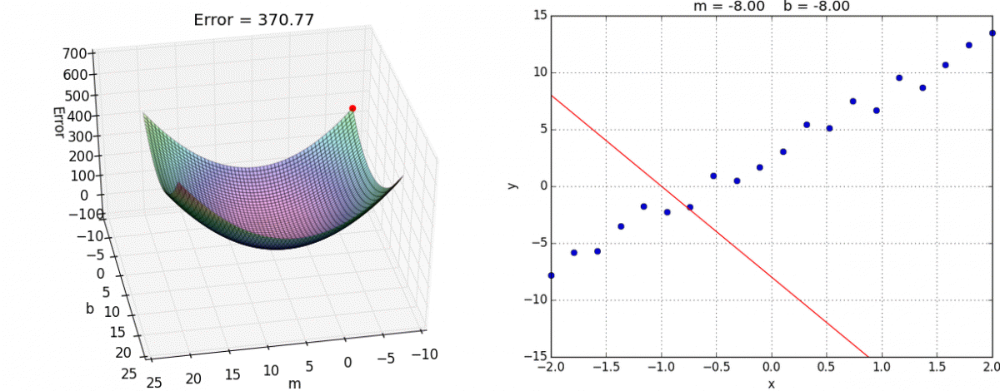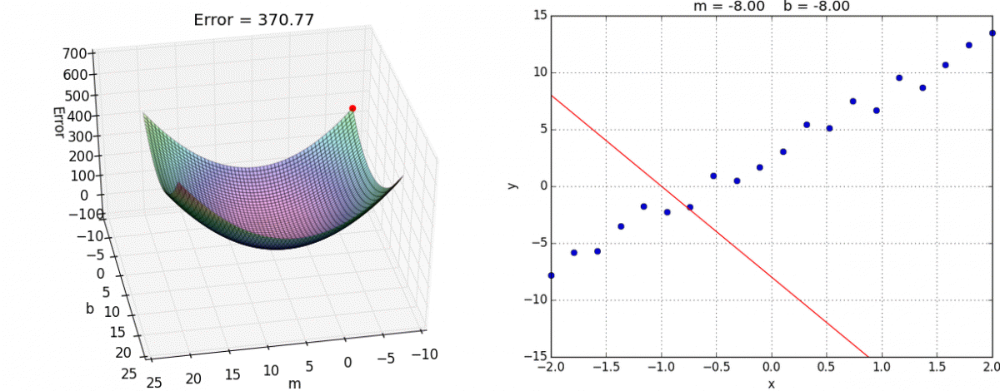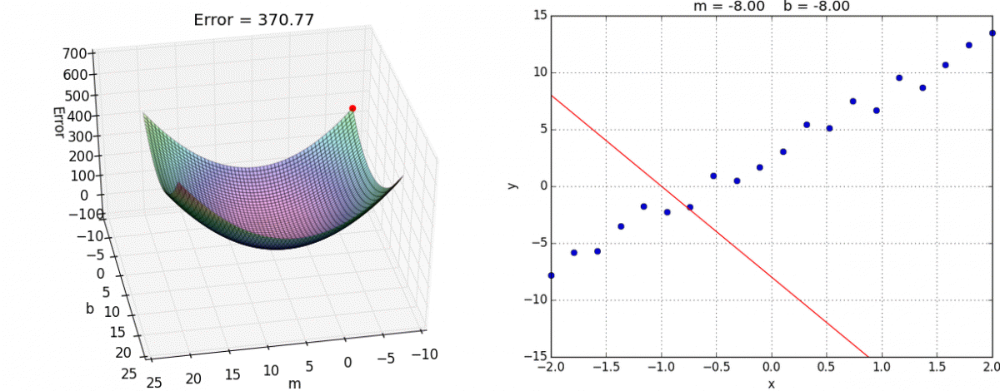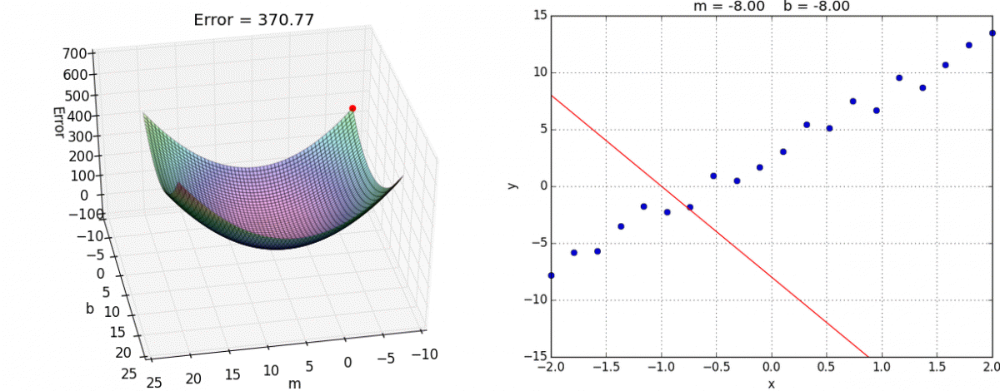### Interactive example

[![Gradient descent line graph](https://github.com/bpesquet/mlhandbook/blob/master/algorithms/images/gradient_descent_line_graph.gif?raw=1)](https://alykhantejani.github.io/a-brief-introduction-to-gradient-descent/)

### Gradient descent types

- *Batch*: use the whole dataset to compute gradients.
  - Safe but potentially slow.
- *Stochastic*: use only one sample.
  - Fast but potentially erratic.
- *Mini-Batch*: use a small set of samples (10-1000).
  - Good compromise.

### Example: applying stochastic gradient descent to predict country happiness

In [21]:
def train_model(model, x, y):
    model.fit(x, y)
    print(f"Model weights: {model.coef_}, bias: {model.intercept_}")

    error = mean_squared_error(y, model.predict(x))
    print(f"Training error: {error:.05f}")


def test_model(model, x, y):
    error = mean_squared_error(y, model.predict(x))
    print(f"Test error: {error:.05f}")

In [22]:
# Create a Linear Regression model (based on Stochastic Gradient Descent)
sgd_model_uni = SGDRegressor(eta0=0.05, early_stopping=True)

# Train and test the model on univariate data
train_model(sgd_model_uni, x_train_uni, y_train_uni)
test_model(sgd_model_uni, x_test_uni, y_test_uni)

Model weights: [2.37344987], bias: [2.96842826]
Training error: 0.44257
Test error: 0.43371


/Users/bolevard/.pyenv/versions/3.6.15/envs/jupvenv/lib/python3.6/site-packages/sklearn/utils/validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



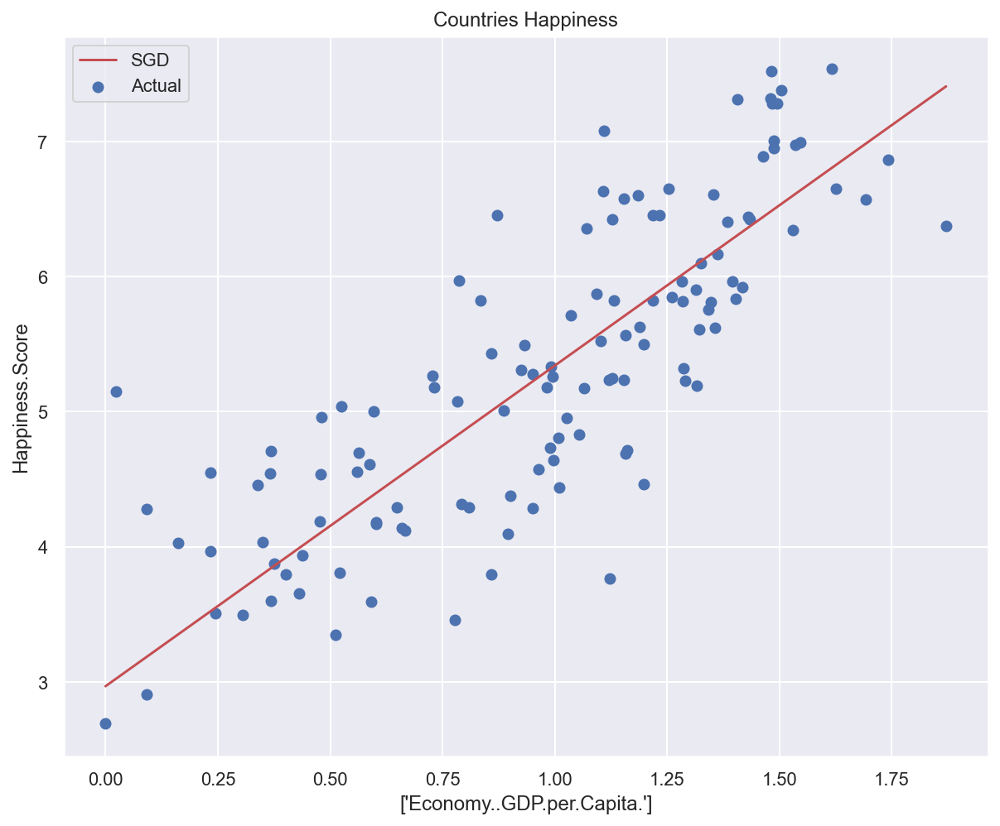

In [23]:
# Plot data and models predictions
plot_univariate(
    x_train_uni,
    y_train_uni,
    input_features_uni,
    target_feature,
    model_list={"SGD": (sgd_model_uni, 'r')},
)

### Pros/cons of iterative approach

Pros:

- Works well with a large number of features.
- MSE loss function convex => guarantee of a global minimum.

Cons:

- Convergence depends on learning rate and GD type.
- Dependant on feature scaling.

## Analytical approach: normal equation

#### Loss minimization

We must find the $\pmb{\theta^*}$ vector that minimizes the loss function $\mathcal{L}(\theta)$.

$$\pmb{\theta^*} = \underset{\theta}{\mathrm{argmin}}\;\mathcal{L}(\theta)$$

The $\pmb{\theta^*}$ vector that minimizes the loss is such as the gradient is equal to $\vec{0}$. In other terms:


$$\nabla_{\theta}\mathcal{L}(\pmb{\theta}) = \nabla_{\theta}\left(\frac{1}{m}(\pmb{\theta}^T\pmb{X}^T\pmb{X}\pmb{\theta} - 2(\pmb{X}\pmb{\theta})^T\pmb{y} + \pmb{y}^T\pmb{y})\right) = 0$$

$$\pmb{X}^T\pmb{X}\pmb{\theta^{*}} - \pmb{X}^T\pmb{y} = \vec{0}$$

$$\pmb{X}^T\pmb{X}\pmb{\theta^{*}} = \pmb{X}^T\pmb{y}$$

If $\pmb{X}^T\pmb{X}$ is an inversible matrix, the result is given by:

$$\pmb{\theta^{*}} = (\pmb{X}^T\pmb{X})^{-1}\pmb{X}^T\pmb{y}$$

Which is exactly the Normal Equation we were expecting to see!

### Analytical solution

- Technique for computing the regression coefficients $\theta_i$ analytically (by calculus).
- One-step learning algorithm (no iterations).
- Also called *Ordinary Least Squares*.

$$\pmb{\theta^{*}} = (\pmb{X}^T\pmb{X})^{-1}\pmb{X}^T\pmb{y}$$

- $\pmb{\theta^*}$ is the parameter vector that minimizes the loss function $\mathcal{L}(\theta)$.
- This result is called the **Normal Equation**.

### Example: applying Normal Equation to predict country happiness

In [24]:
def train_model(model, x, y):
    model.fit(x, y)
    print(f"Model weights: {model.coef_}, bias: {model.intercept_}")

    error = mean_squared_error(y, model.predict(x))
    print(f"Training error: {error:.05f}")


def test_model(model, x, y):
    error = mean_squared_error(y, model.predict(x))
    print(f"Test error: {error:.05f}")

In [25]:
# Create a Linear Regression model (based on Normal Equation)
lr_model = LinearRegression()

# Train and test the model on univariate data
train_model(lr_model, x_train_uni, y_train_uni)
test_model(lr_model, x_test_uni, y_test_uni)

Model weights: [[2.15574875]], bias: [3.2032706]
Training error: 0.43367
Test error: 0.43068


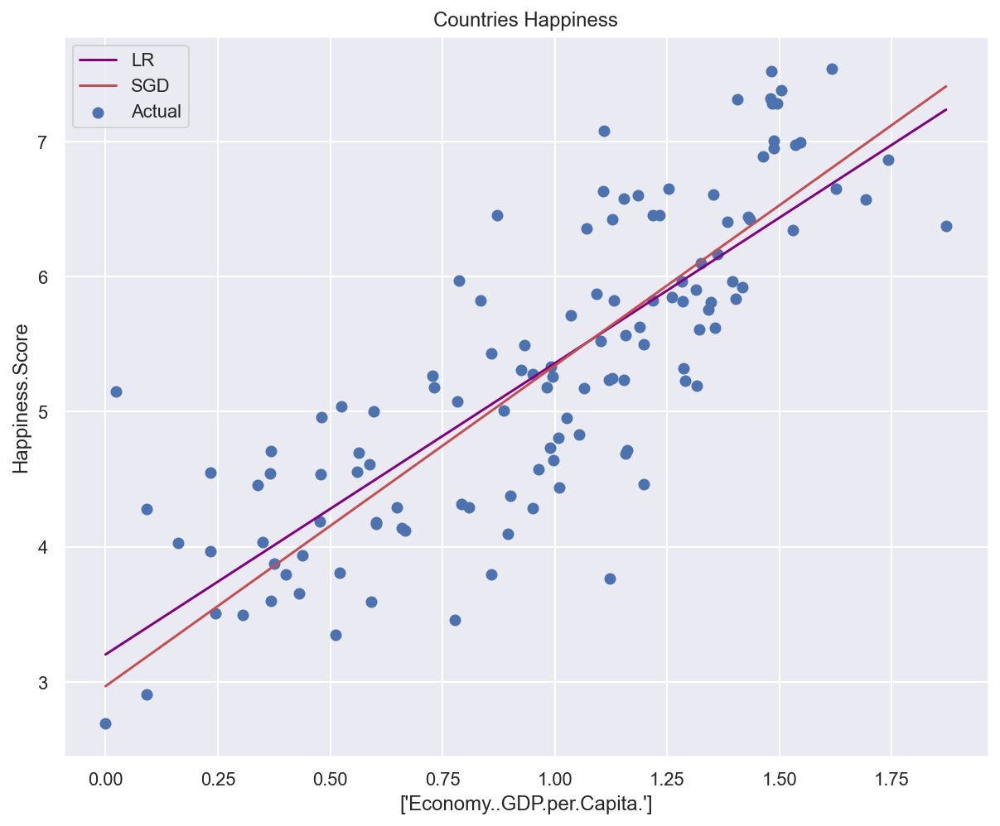

In [26]:
# Plot data and model prediction
plot_univariate(
    x_train_uni,
    y_train_uni,
    input_features_uni,
    target_feature,
    model_list={"LR": (lr_model, 'purple'), "SGD": (sgd_model_uni, 'r')},
)

### Multivariate regression

General case: several features are used by the model.

$$y' = \theta_0 + \theta_1x_1 + \dotsc + \theta_nx_n$$

In [27]:
# Using two input features: GDP and degree of freedom
input_features_multi = ["Economy..GDP.per.Capita.", "Freedom"]

### YOUR CODE HERE

x_train_multi, y_train_multi, x_test_multi, y_test_multi = split_dataset(df_happiness, input_features_multi, 'Happiness.Score', 0.8)
###

In [28]:
l = [x_train_multi, y_train_multi, x_test_multi, y_test_multi]
for x in l:
  print(x.shape)

(124, 2)
(124, 1)
(31, 2)
(31, 1)


In [29]:
def plot_multivariate(x, y, input_features, target_features, model=None):
    """3D plot of features and target, including model prediction if defined"""
    
    # Configure the plot with training dataset
    plot_training_trace = go.Scatter3d(
        x=x[:, 0].flatten(),
        y=x[:, 1].flatten(),
        z=y.flatten(),
        name="Actual",
        mode="markers",
        marker={
            "size": 10,
            "opacity": 1,
            "line": {"color": "rgb(255, 255, 255)", "width": 1},
        },
    )

    plot_data = plot_training_trace

    if model is not None:
        # Generate different combinations of X and Y sets to build a predictions plane.
        predictions_count = 10

        # Find min and max values along X and Y axes.
        x_min = x[:, 0].min()
        x_max = x[:, 0].max()

        y_min = x[:, 1].min()
        y_max = x[:, 1].max()

        # Generate predefined numbe of values for eaxh axis betwing correspondent min and max values.
        x_axis = np.linspace(x_min, x_max, predictions_count)
        y_axis = np.linspace(y_min, y_max, predictions_count)

        # Create empty vectors for X and Y axes predictions
        # We're going to find cartesian product of all possible X and Y values.
        x_pred = np.zeros((predictions_count * predictions_count, 1))
        y_pred = np.zeros((predictions_count * predictions_count, 1))

        # Find cartesian product of all X and Y values.
        x_y_index = 0
        for x_index, x_value in enumerate(x_axis):
            for y_index, y_value in enumerate(y_axis):
                x_pred[x_y_index] = x_value
                y_pred[x_y_index] = y_value
                x_y_index += 1

        # Predict Z value for all X and Y pairs.
        z_pred = model.predict(np.hstack((x_pred, y_pred)))

        # Plot training data with predictions.

        # Configure the plot with test dataset.
        plot_predictions_trace = go.Scatter3d(
            x=x_pred.flatten(),
            y=y_pred.flatten(),
            z=z_pred.flatten(),
            name="Prediction Plane",
            mode="markers",
            marker={"size": 1,},
            opacity=0.8,
            surfaceaxis=2,
        )

        plot_data = [plot_training_trace, plot_predictions_trace]

    # Configure the layout.
    plot_layout = go.Layout(
        title="Date Sets",
        scene={
            "xaxis": {"title": input_features[0]},
            "yaxis": {"title": input_features[1]},
            "zaxis": {"title": target_feature},
        },
        margin={"l": 0, "r": 0, "b": 0, "t": 0},
    )

    plot_figure = go.Figure(data=plot_data, layout=plot_layout)

    # Render 3D scatter plot.
    plotly.offline.iplot(plot_figure)

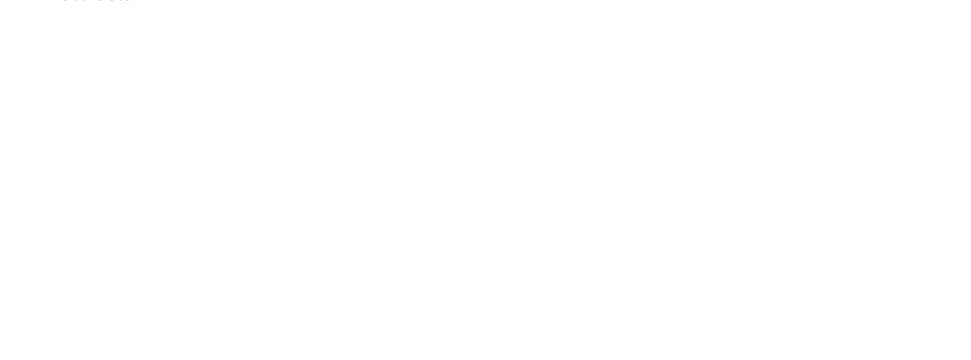

In [30]:
# Plot training data
plot_multivariate(x_train_multi, y_train_multi, input_features_multi, target_feature)

In [31]:
# Create a Linear Regression model (based on Normal Equation)
lr_model_multi = LinearRegression()

# Train and test the model on multivariate data
train_model(lr_model_multi, x_train_multi, y_train_multi)
test_model(lr_model_multi, x_test_multi, y_test_multi)

Model weights: [[1.86517304 2.28584765]], bias: [2.60702493]
Training error: 0.32069
Test error: 0.34625


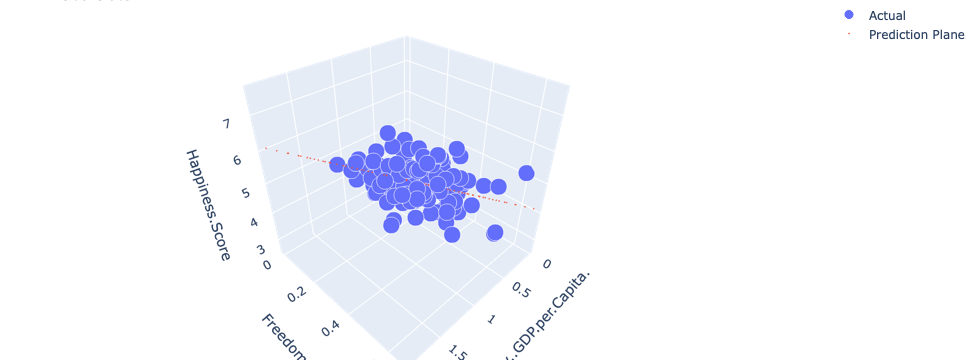

In [32]:
# Plot data and model prediction
plot_multivariate(x_train_multi, y_train_multi, input_features_multi, target_feature, lr_model_multi)

### Pros/cons of analytical approach

Pros:

- Computed in one step.
- Exact solution.

Cons:

- Computation of $(\pmb{X}^T\pmb{X})^{-1}$ is slow when the number of features is large ($n > 10^4$).
- Doesn't work if $\pmb{X}^T\pmb{X}$ is not inversible.


## Polynomial Regression

### General idea

- How can a linear model fit non-linear data?
- Solution: add powers of each feature as new features.
- The hypothesis function is still linear.
- High-degree polynomial regression can be subject to severe overfitting.

### Example: fitting a quadratic curve with polynomial regression

In [33]:
# Generate quadratic data with noise
# (ripped from https://github.com/ageron/handson-ml2)

m = 200
# Generate m data samples between -3 and 3
x_quad = 6 * np.random.rand(m, 1) - 3

# y = 0,5x^2 + x + 2 + noise
y_quad = 0.5 * x_quad**2 + x_quad + 2 + np.random.randn(m, 1)

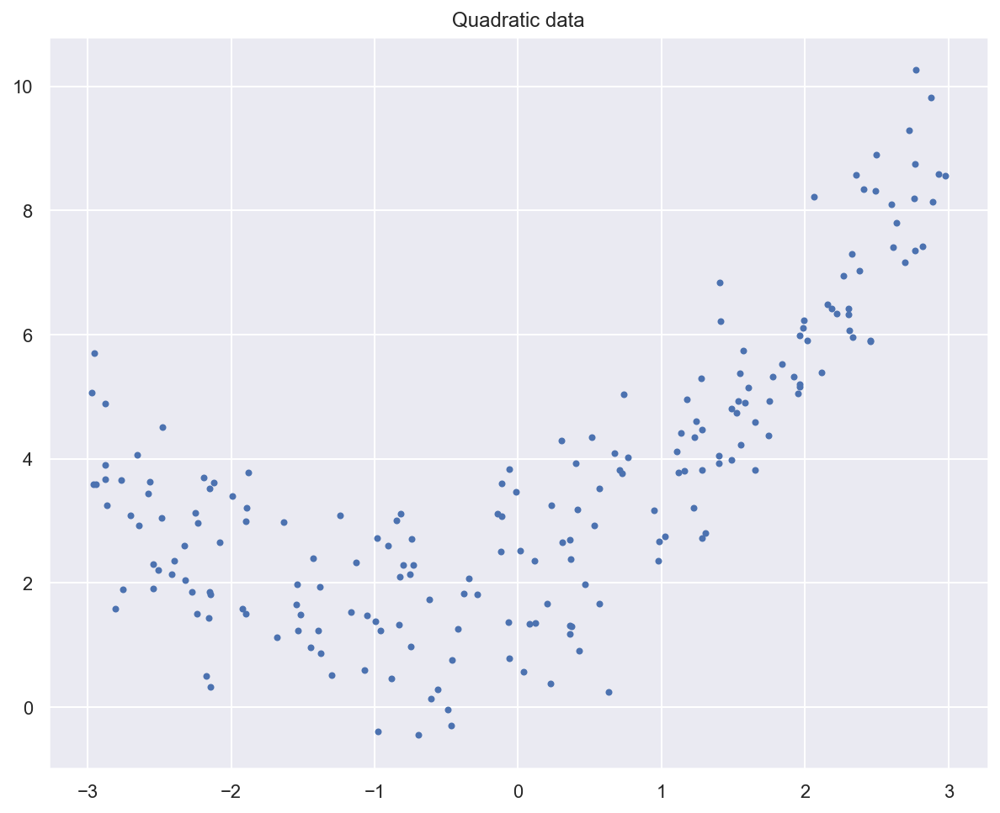

In [34]:
# Plot generated data
plt.plot(x_quad, y_quad, "b.")
plt.title("Quadratic data")
plt.show()

In [35]:
print(x_quad.shape)
print(y_quad.shape)

(200, 1)
(200, 1)


In [36]:
print(x_quad[:5])

[[ 1.28114316]
 [ 1.17967123]
 [ 1.11674332]
 [-0.28407737]
 [-2.97435377]]


In [37]:
model = LinearRegression()
model.fit(x_quad, y_quad)

LinearRegression()

In [38]:
import math
print(math.sqrt(2.95233))

1.718234559075099


In [39]:
test_model(model, x_quad, y_quad)

Test error: 2.85471


In [40]:
def get_quadratic_features(x, include_bias=True):
    """Generate quadratic and interaction features.

    # x: np.ndarray [num_samples, num_feature]
    # include_bias: boolean [True, False]

    include_bias=True
    [x_0         [[x_0, 1]        [[x_0, x_0^2, 1]
    x_1..   ->    [x_1, 1]... ->   [x_1, x_1^2, 1]
    x_n]          [x_n, 1]         [x_n, x_n^2, 1]

    [x_0, z_0]         [[x_0, z_0, 1]        [[x_0, z_0, x_0^2, z_0^2, x_0*z_0, 1]
    x_1, z_1   ->      [x_1, z_1, 1]... ->   [x_1, z_1, x_1^2, z_1^2, z_1*z_1, 1]
    x_n, z_n]          [x_n, z_n, 1]         [x_n, z_n, x_n^2, z_n^2, x_n*z_n, 1]

    [x_0, z_0, k_0]        [[x_0, z_0, x_0^2, z_0^2, x_0*z_0, x_0*k_0, z_0*k_0, 1]
    x_1, z_1, k_1   ->     [x_1, z_1, x_1^2, z_1^2, z_1*z_1, 1]
    x_n, z_n, k_n]         [x_n, z_n, x_n^2, z_n^2, x_n*z_n, 1]

    Generate a new feature matrix consisting of all quadratic combinations
    of the features.
    For example, if an input sample is two dimensional and of the form [a, b],
    the degree-2 polynomial features are [1, a, b, a^2, ab, b^2]."""


    if include_bias:
        K = len(x[0])
        arr = np.empty([len(x), int(K * (K + 1) / 2 + 1) + K])
    else:
        K = len(x[0])
        arr = np.empty([len(x), int(K * (K + 1) / 2) + K])

    for row in range(len(x)):
        n_row = []
        if include_bias:
            n_row.append(1)
        i = 0
        for val1 in x[row]:
            i += 1
            n_row.append(val1)
            for val2 in x[row][:i]:
                n_row.append(val1*val2)
        for vl in range(len(n_row)):
            arr[row][vl] = n_row[vl]
    return arr

In [41]:
poly_model = LinearRegression()

In [42]:
poly_model.fit(get_quadratic_features(x_quad), y_quad)

LinearRegression()

In [43]:
test_model(poly_model, get_quadratic_features(x_quad), y_quad)

Test error: 0.97546


In [44]:
print(f"Initial feature for first sample: {x_quad[0]}")

# Add quadratic features to the dataset
x_quad_poly = get_quadratic_features(x_quad, include_bias=False)

print(f"New features for first sample: {x_quad_poly[0]}")

Initial feature for first sample: [1.28114316]
New features for first sample: [1.28114316 1.64132779]


In [45]:
# Fit a linear regression model to the extended data
lr_model_poly = LinearRegression()
lr_model_poly.fit(x_quad_poly, y_quad)

# Should be close to [1, 0,5] and 2
print(f"Model weights: {lr_model_poly.coef_}, bias: {lr_model_poly.intercept_}")

Model weights: [[0.92049201 0.50559894]], bias: [2.03123944]


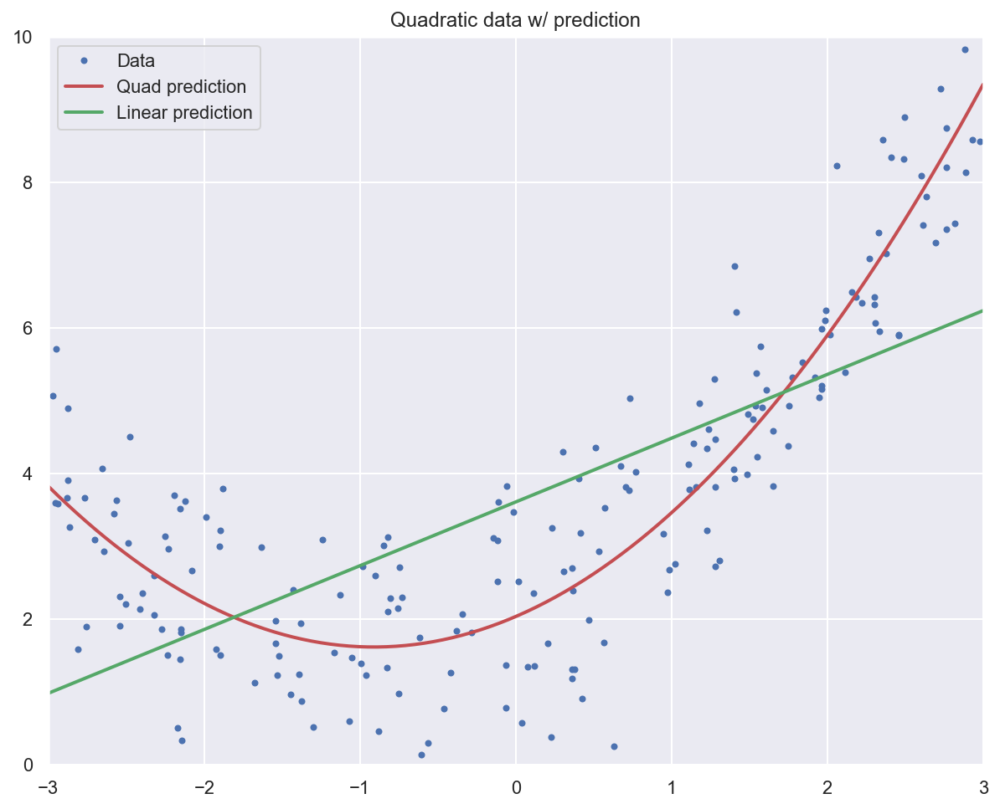

In [46]:
# Plot data and model prediction
plt.plot(x_quad, y_quad, "b.", label="Data")
x_pred = np.linspace(-3, 3, m).reshape(m, 1)
x_pred_poly = get_quadratic_features(x_pred)
y_pred = poly_model.predict(x_pred_poly)
y_pred2 = model.predict(x_pred)
plt.plot(x_pred, y_pred, "r-", linewidth=2, label="Quad prediction")
plt.plot(x_pred, y_pred2, "g-", linewidth=2, label="Linear prediction")
plt.axis([-3, 3, 0, 10])
plt.legend()
plt.title("Quadratic data w/ prediction")
plt.show()

In [47]:
print(f"Model weights: {poly_model.coef_}, bias: {poly_model.intercept_}")

Model weights: [[0.         0.92049201 0.50559894]], bias: [2.03123944]


## Regularization

### General idea

- Solution against overfitting: constraining model parameters to take small values.

- *Ridge regression* (using l2 norm): 

$$\mathcal{L}(\pmb{\theta}) = \mathrm{MSE}(\pmb{\theta}) + \frac{\lambda}{2}\sum_{i=1}^n \theta_i^2$$

- *Lasso regression* (using l1 norm):

$$\mathcal{L}(\pmb{\theta}) = \mathrm{MSE}(\pmb{\theta}) + \lambda\sum_{i=1}^n |\theta_i|$$

- $\lambda$ is called the **regularization rate**.

### Example: observing the effects of regularization rate

In [48]:
m = 20
x_reg = 3 * np.random.rand(m, 1)
y_reg = 1 + 0.5 * x_reg + np.random.randn(m, 1) / 1.5
x_new = np.linspace(0, 3, 100).reshape(100, 1)

In [49]:
def plot_model(model_class, polynomial, lambdas, **model_kargs):
    # Plot data and predictions for several regularization rates
    for reg_rate, style in zip(lambdas, ("b-", "g--", "r:")):
        model = model_class(reg_rate, **model_kargs) if reg_rate > 0 else LinearRegression()
        if polynomial:
            model = Pipeline([
                    ("poly_features", PolynomialFeatures(degree=10, include_bias=False)),
                    ("std_scaler", StandardScaler()),
                    ("regul_reg", model),
                ])
        model.fit(x_reg, y_reg)
        y_new_regul = model.predict(x_new)
        lw = 2 if reg_rate > 0 else 1
        plt.plot(x_new, y_new_regul, style, linewidth=lw, label=r"$\lambda = {}$".format(reg_rate))
    plt.plot(x_reg, y_reg, "b.", linewidth=3)
    plt.legend(loc="upper left", fontsize=15)
    plt.xlabel("$x$", fontsize=18)
    plt.axis([0, 3, 0, 4])

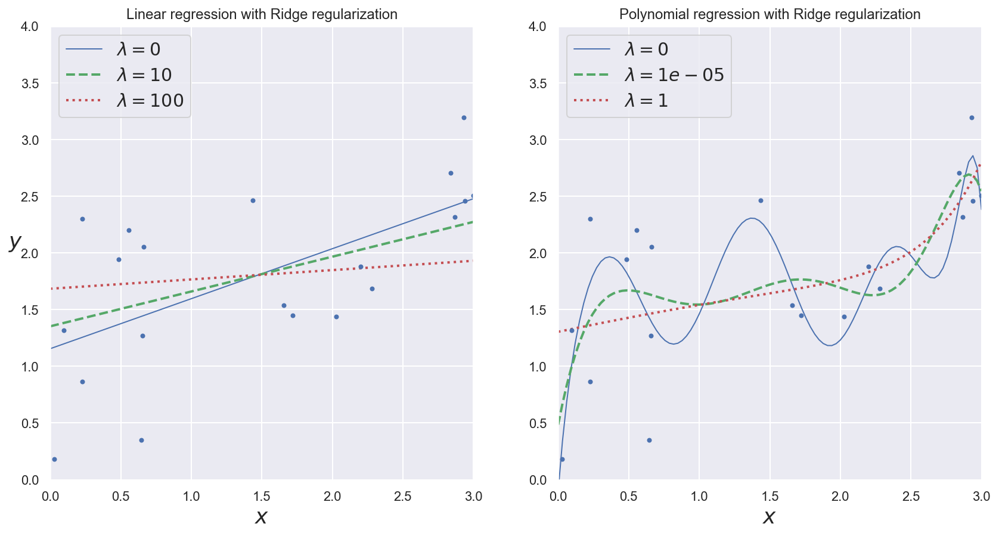

In [55]:
# Plot data and predictions with varying regularization rates
plt.figure(figsize=(14,7))
plt.subplot(121)
plot_model(Ridge, polynomial=False, lambdas=(0, 10, 100), random_state=42)
plt.ylabel("$y$", rotation=0, fontsize=18)
plt.title("Linear regression with Ridge regularization")
plt.subplot(122)
plot_model(Ridge, polynomial=True, lambdas=(0, 10**-5, 1), random_state=42)
plt.title("Polynomial regression with Ridge regularization")
plt.show()